<h1 style="margin: auto; padding: 20px 0; text-align: center">PROJET 6 DATA ANALYST</h1>
<h2 style="margin: auto; padding: 20px 0; text-align: center">Analysez les ventes d'une librairie</h2>

In [1]:
#Importation des librairies
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
pd.set_option('display.max_rows', 10000)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

<div >
<h3 style="margin: auto; padding: 20px; ">1. Chargement des fichiers</h3>
</div>

<div >
<h4 style="margin: auto; padding: 20px; ">1.1 Fichier Produits</h4>
</div>

In [3]:
products = pd.read_csv("products.csv", delimiter=';')
products.head()

,id_prod,price,categ
0,0_1421,19.99,0
1,0_1368,5.13,0
2,0_731,17.99,0
3,1_587,4.99,1
4,0_1507,3.99,0


In [4]:
products.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3286 entries, 0 to 3285
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id_prod  3286 non-null   object 
 1   price    3286 non-null   float64
 2   categ    3286 non-null   int64  
dtypes: float64(1), int64(1), object(1)
memory usage: 77.1+ KB


In [5]:
products.describe()

,price,categ
count,3286.000000,3286.000000
mean,21.863597,0.370359
std,29.849786,0.615446
min,0.620000,0.000000
25%,6.990000,0.000000
50%,13.075000,0.000000
75%,22.990000,1.000000
max,300.000000,2.000000


<div >
<h4 style="margin: auto; padding: 20px; ">1.2 Fichier Transactions</h4>
</div>

In [6]:
transactions = pd.read_csv("Transactions.csv", delimiter=';')
transactions.head()

,id_prod,date,session_id,client_id
0,0_1259,2021-03-01 00:01:07.843138,s_1,c_329
1,0_1390,2021-03-01 00:02:26.047414,s_2,c_664
2,0_1352,2021-03-01 00:02:38.311413,s_3,c_580
3,0_1458,2021-03-01 00:04:54.559692,s_4,c_7912
4,0_1358,2021-03-01 00:05:18.801198,s_5,c_2033


In [7]:
transactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 687534 entries, 0 to 687533
Data columns (total 4 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   id_prod     687534 non-null  object
 1   date        687534 non-null  object
 2   session_id  687534 non-null  object
 3   client_id   687534 non-null  object
dtypes: object(4)
memory usage: 21.0+ MB


In [8]:
transactions['day'] = transactions['date'].apply(str)

In [9]:
transactions['day'] = transactions['day'].apply(lambda x: x[0:10])
transactions.head()

,id_prod,date,session_id,client_id,day
0,0_1259,2021-03-01 00:01:07.843138,s_1,c_329,2021-03-01
1,0_1390,2021-03-01 00:02:26.047414,s_2,c_664,2021-03-01
2,0_1352,2021-03-01 00:02:38.311413,s_3,c_580,2021-03-01
3,0_1458,2021-03-01 00:04:54.559692,s_4,c_7912,2021-03-01
4,0_1358,2021-03-01 00:05:18.801198,s_5,c_2033,2021-03-01


In [10]:
transactions['day'] = pd.to_datetime(transactions['day'])

In [11]:
transactions['month'] = transactions['day'].dt.month
transactions['year'] = transactions['day'].dt.year

In [12]:
transactions.head()

,id_prod,date,session_id,client_id,day,month,year
0,0_1259,2021-03-01 00:01:07.843138,s_1,c_329,2021-03-01,3,2021
1,0_1390,2021-03-01 00:02:26.047414,s_2,c_664,2021-03-01,3,2021
2,0_1352,2021-03-01 00:02:38.311413,s_3,c_580,2021-03-01,3,2021
3,0_1458,2021-03-01 00:04:54.559692,s_4,c_7912,2021-03-01,3,2021
4,0_1358,2021-03-01 00:05:18.801198,s_5,c_2033,2021-03-01,3,2021


<h4 style="margin: auto; padding: 20px; ">1.3 Fichier Clients</h4>

In [13]:
customers = pd.read_csv('customers.csv', delimiter=';')
customers.head()

,client_id,sex,birth
0,c_4410,f,1967
1,c_7839,f,1975
2,c_1699,f,1984
3,c_5961,f,1962
4,c_5320,m,1943


In [14]:
customers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8621 entries, 0 to 8620
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   client_id  8621 non-null   object
 1   sex        8621 non-null   object
 2   birth      8621 non-null   int64 
dtypes: int64(1), object(2)
memory usage: 202.2+ KB


In [15]:
customers = customers.assign(age = 2023 - customers['birth'])

In [16]:
customers.describe()

,birth,age
count,8621.000000,8621.000000
mean,1978.275606,44.724394
std,16.917958,16.917958
min,1929.000000,19.000000
25%,1966.000000,31.000000
50%,1979.000000,44.000000
75%,1992.000000,57.000000
max,2004.000000,94.000000


In [17]:
customers.groupby('age').count().reset_index()

,age,client_id,sex,birth
0,19,440,440,440
1,20,146,146,146
2,21,146,146,146
3,22,127,127,127
4,23,136,136,136
5,24,160,160,160
6,25,138,138,138
7,26,152,152,152
8,27,179,179,179
9,28,175,175,175


In [18]:
customers['age_bins'] = pd.cut(x=customers['age'], bins=[10,29,39,49,59,69,79,99],
                               labels=['-30','30s','40s','50s','60s','70s','+80'])
customers

,client_id,sex,birth,age,age_bins
0,c_4410,f,1967,56,50s
1,c_7839,f,1975,48,40s
2,c_1699,f,1984,39,30s
3,c_5961,f,1962,61,60s
4,c_5320,m,1943,80,+80
5,c_415,m,1993,30,30s
6,c_285,f,1967,56,50s
7,c_160,f,1978,45,40s
8,c_6446,m,1971,52,50s
9,c_6866,m,1993,30,30s


<h4 style="margin: auto; padding: 20px; ">1.4 Fusion des fichiers</h4>

In [19]:
data = products.merge(transactions,how='inner').merge(customers,how='inner')
data.head()

,id_prod,price,categ,date,session_id,client_id,day,month,year,sex,birth,age,age_bins
0,0_1421,19.99,0,2021-03-01 04:13:00.107748,s_101,c_8533,2021-03-01,3,2021,m,1972,51,50s
1,0_1421,19.99,0,2022-10-01 04:13:00.107748,s_276043,c_8533,2022-10-01,10,2022,m,1972,51,50s
2,0_1421,19.99,0,2022-12-01 04:13:00.107748,s_305391,c_8533,2022-12-01,12,2022,m,1972,51,50s
3,0_1421,19.99,0,2023-01-01 04:13:00.107748,s_320253,c_8533,2023-01-01,1,2023,m,1972,51,50s
4,0_2199,12.99,0,2021-03-25 17:43:48.819074,s_11366,c_8533,2021-03-25,3,2021,m,1972,51,50s


<div >
<h3 style="margin: auto; padding: 20px; ">2. Analyse des données</h3>
</div>

<h4 style="margin: auto; padding: 20px; ">2.1 Analyse autour du chiffre d'affaire</h4>

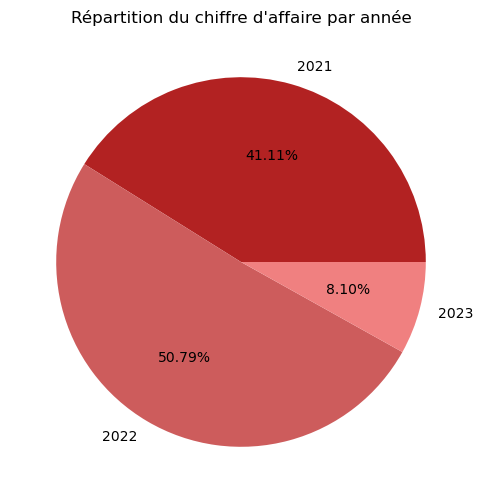

In [20]:
data1 = data.groupby('year')['price'].sum().reset_index()
plt.figure(figsize=(10,6))
plt.pie(x=data1['price'], labels=data1['year'], autopct='%.2f%%', colors=['firebrick','indianred','lightcoral'])
plt.title("Répartition du chiffre d'affaire par année")
plt.show()

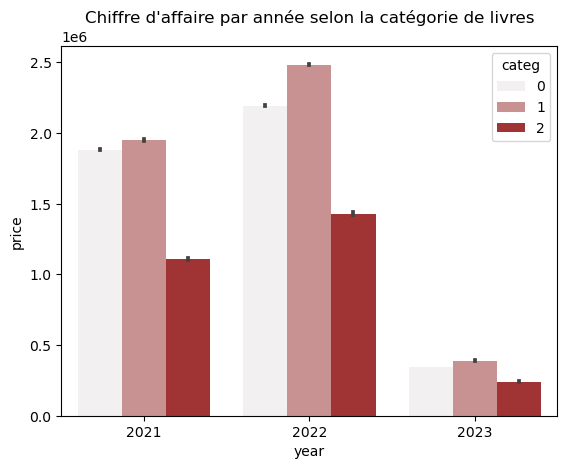

In [21]:
sns.barplot(data=data, x='year',y='price',estimator=sum, hue='categ', color='firebrick')
plt.title("Chiffre d'affaire par année selon la catégorie de livres")
plt.show()

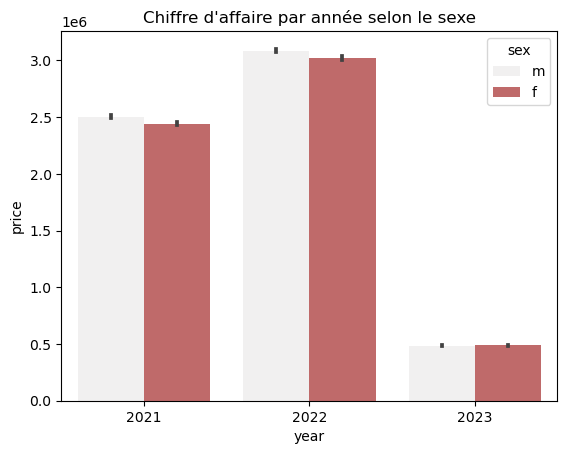

In [22]:
sns.barplot(data=data, x='year', y='price', estimator=sum, hue='sex', color='indianred')
plt.title("Chiffre d'affaire par année selon le sexe")
plt.show()

In [23]:
data2021 = data.loc[data['year'] == 2021 ,:]
data2021.head()

,id_prod,price,categ,date,session_id,client_id,day,month,year,sex,birth,age,age_bins
0,0_1421,19.99,0,2021-03-01 04:13:00.107748,s_101,c_8533,2021-03-01,3,2021,m,1972,51,50s
4,0_2199,12.99,0,2021-03-25 17:43:48.819074,s_11366,c_8533,2021-03-25,3,2021,m,1972,51,50s
5,0_617,17.99,0,2021-04-30 20:37:32.311418,s_28090,c_8533,2021-04-30,4,2021,m,1972,51,50s
8,0_1172,10.71,0,2021-04-30 20:46:10.788548,s_28090,c_8533,2021-04-30,4,2021,m,1972,51,50s
11,1_717,9.99,1,2021-03-25 17:31:59.734152,s_11366,c_8533,2021-03-25,3,2021,m,1972,51,50s


In [24]:
dt2021 = data2021.groupby('month')[['price']].sum().reset_index()
dt2021

,month,price
0,3,482440.61
1,4,476109.30
2,5,492943.47
3,6,484088.56
4,7,482835.40
5,8,482284.79
6,9,507240.68
7,10,494733.16
8,11,516167.73
9,12,525917.28


In [25]:
data2022 = data.loc[data['year'] == 2022 ,:]
data2022.head()

,id_prod,price,categ,date,session_id,client_id,day,month,year,sex,birth,age,age_bins
1,0_1421,19.99,0,2022-10-01 04:13:00.107748,s_276043,c_8533,2022-10-01,10,2022,m,1972,51,50s
2,0_1421,19.99,0,2022-12-01 04:13:00.107748,s_305391,c_8533,2022-12-01,12,2022,m,1972,51,50s
6,0_617,17.99,0,2022-05-30 20:37:32.311418,s_216491,c_8533,2022-05-30,5,2022,m,1972,51,50s
7,0_617,17.99,0,2022-10-30 20:37:32.311418,s_290322,c_8533,2022-10-30,10,2022,m,1972,51,50s
9,0_1172,10.71,0,2022-05-30 20:46:10.788548,s_216491,c_8533,2022-05-30,5,2022,m,1972,51,50s


In [26]:
dt2022 = data2022.groupby('month')[['price']].sum().reset_index()
dt2022

,month,price
0,1,525338.99
1,2,535571.50
2,3,515456.53
3,4,492998.94
4,5,517132.60
5,6,496016.12
6,7,510783.12
7,8,506467.27
8,9,494114.53
9,10,507917.77


In [27]:
data2023 = data.loc[data['year'] == 2023 ,:]
data2023.head()

,id_prod,price,categ,date,session_id,client_id,day,month,year,sex,birth,age,age_bins
3,0_1421,19.99,0,2023-01-01 04:13:00.107748,s_320253,c_8533,2023-01-01,1,2023,m,1972,51,50s
27,0_1278,8.96,0,2023-01-01 04:48:32.880371,s_320253,c_8533,2023-01-01,1,2023,m,1972,51,50s
36,1_414,23.83,1,2023-01-01 04:46:16.668266,s_320253,c_8533,2023-01-01,1,2023,m,1972,51,50s
54,0_1421,19.99,0,2023-01-01 13:48:20.214075,s_320437,c_5299,2023-01-01,1,2023,f,1967,56,50s
58,1_457,22.99,1,2023-01-27 04:50:07.162804,s_332997,c_5299,2023-01-27,1,2023,f,1967,56,50s


In [28]:
dt2023 = data2023.groupby('month')[['price']].sum().reset_index()
dt2023

,month,price
0,1,517540.55
1,2,456679.76


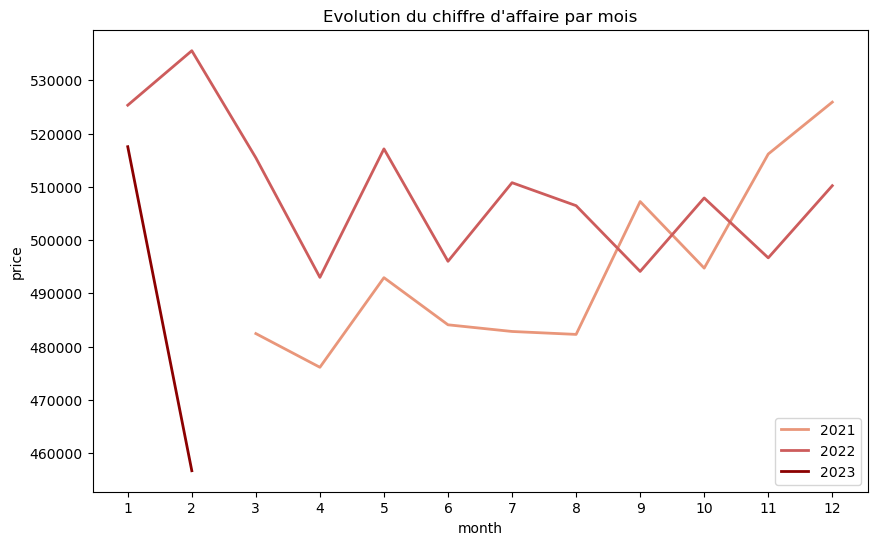

In [29]:
plt.figure(figsize=(10,6))
sns.lineplot(data=dt2021, x='month', y='price', label= '2021',color='darksalmon',lw=2)
sns.lineplot(data=dt2022, x='month', y='price', label= '2022',color='indianred',lw=2)
sns.lineplot(data=dt2023, x='month', y='price', label= '2023',color='darkred',lw=2)
plt.xticks([1,2,3,4,5,6,7,8,9,10,11,12])
plt.title("Evolution du chiffre d'affaire par mois")
plt.legend()

In [30]:
data.describe()

,price,categ,month,year,birth,age
count,687534.000000,687534.000000,687534.000000,687534.000000,687534.000000,687534.000000
mean,17.493918,0.448789,6.547208,2021.662289,1977.817391,45.182609
std,18.238337,0.594563,3.480693,0.618184,13.607935,13.607935
min,0.620000,0.000000,1.000000,2021.000000,1929.000000,19.000000
25%,8.990000,0.000000,4.000000,2021.000000,1970.000000,36.000000
50%,13.990000,0.000000,7.000000,2022.000000,1980.000000,43.000000
75%,19.080000,1.000000,10.000000,2022.000000,1987.000000,53.000000
max,300.000000,2.000000,12.000000,2023.000000,2004.000000,94.000000


<h4 style="margin: auto; padding: 20px; ">2.2 Tendance globale</h4>

In [31]:
liste = dt2021['price'].to_list() + dt2022['price'].to_list() + dt2023['price'].to_list()

Text(0.5, 1.0, 'Moyenne mobile de 2021 à 2023 par mois')

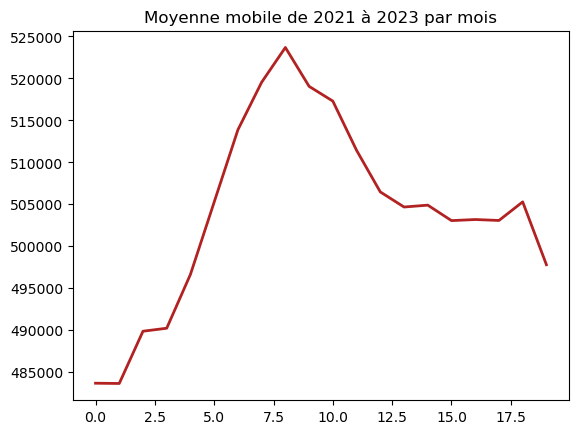

In [32]:
#Décomposition en moyenne mobile par mois

def moving_average(x, w):
    return np.convolve(x, np.ones(w), 'valid') / w
dt = liste
sns.lineplot(moving_average(dt,5), lw=2, color='firebrick')
plt.title("Moyenne mobile de 2021 à 2023 par mois")

In [33]:
ca_jour = data.groupby('day')['price'].sum().reset_index()
liste_jour = ca_jour['price'].to_list()

Text(0.5, 1.0, 'Moyenne mobile par jour')

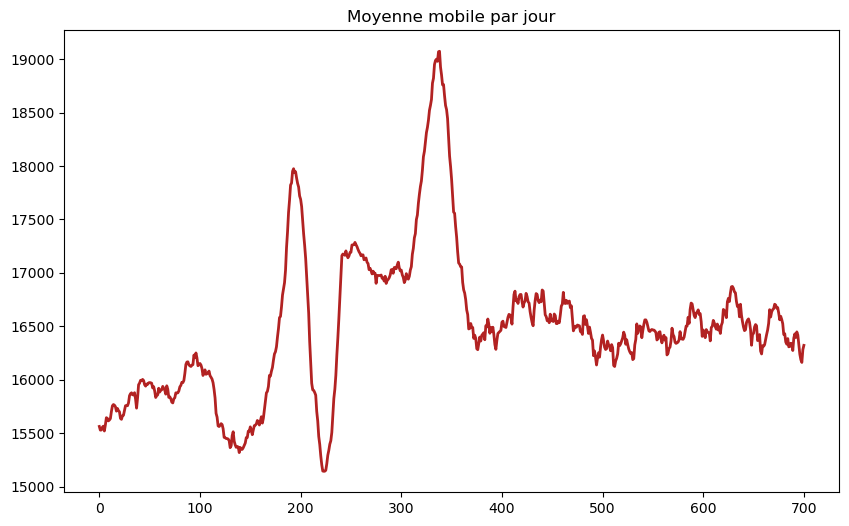

In [34]:
#Décomposition en moyenne mobile par jour

def moving_average(x, w):
    return np.convolve(x, np.ones(w), 'valid') / w
dt = liste_jour

plt.figure(figsize=(10,6))
sns.lineplot(moving_average(dt,30), lw=2, color='firebrick')
plt.title("Moyenne mobile par jour")

<h4 style="margin: auto; padding: 20px; ">2.3 Analyse des références produits</h4>

In [35]:
data.groupby('id_prod').count().sort_values('price',ascending=False)

,price,categ,date,session_id,client_id,day,month,year,sex,birth,age,age_bins
id_prod,,,,,,,,,,,,
1_369,2340,2340,2340,2340,2340,2340,2340,2340,2340,2340,2340,2340
1_417,2269,2269,2269,2269,2269,2269,2269,2269,2269,2269,2269,2269
1_414,2246,2246,2246,2246,2246,2246,2246,2246,2246,2246,2246,2246
1_498,2202,2202,2202,2202,2202,2202,2202,2202,2202,2202,2202,2202
1_425,2163,2163,2163,2163,2163,2163,2163,2163,2163,2163,2163,2163
1_403,2040,2040,2040,2040,2040,2040,2040,2040,2040,2040,2040,2040
1_413,2036,2036,2036,2036,2036,2036,2036,2036,2036,2036,2036,2036
1_412,2014,2014,2014,2014,2014,2014,2014,2014,2014,2014,2014,2014
1_406,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003


In [36]:
cat0 = data.loc[data['categ'] == 0,:]
cat0.head()

,id_prod,price,categ,date,session_id,client_id,day,month,year,sex,birth,age,age_bins
0,0_1421,19.99,0,2021-03-01 04:13:00.107748,s_101,c_8533,2021-03-01,3,2021,m,1972,51,50s
1,0_1421,19.99,0,2022-10-01 04:13:00.107748,s_276043,c_8533,2022-10-01,10,2022,m,1972,51,50s
2,0_1421,19.99,0,2022-12-01 04:13:00.107748,s_305391,c_8533,2022-12-01,12,2022,m,1972,51,50s
3,0_1421,19.99,0,2023-01-01 04:13:00.107748,s_320253,c_8533,2023-01-01,1,2023,m,1972,51,50s
4,0_2199,12.99,0,2021-03-25 17:43:48.819074,s_11366,c_8533,2021-03-25,3,2021,m,1972,51,50s


In [37]:
cat1 = data.loc[data['categ'] == 1,:]
cat1.head()

,id_prod,price,categ,date,session_id,client_id,day,month,year,sex,birth,age,age_bins
11,1_717,9.99,1,2021-03-25 17:31:59.734152,s_11366,c_8533,2021-03-25,3,2021,m,1972,51,50s
21,1_684,11.20,1,2021-04-30 19:58:16.261966,s_28090,c_8533,2021-04-30,4,2021,m,1972,51,50s
22,1_684,11.20,1,2022-05-30 19:58:16.261966,s_216491,c_8533,2022-05-30,5,2022,m,1972,51,50s
23,1_684,11.20,1,2022-10-30 19:58:16.261966,s_290322,c_8533,2022-10-30,10,2022,m,1972,51,50s
30,1_256,26.05,1,2021-11-02 01:57:36.771970,s_113487,c_8533,2021-11-02,11,2021,m,1972,51,50s


In [38]:
cat2 = data.loc[data['categ'] == 2,:]
cat2.head()

,id_prod,price,categ,date,session_id,client_id,day,month,year,sex,birth,age,age_bins
208,2_210,132.52,2,2021-08-09 19:59:08.547632,s_73554,c_8024,2021-08-09,8,2021,f,1936,87,+80
209,2_210,132.52,2,2022-09-09 19:59:08.547632,s_265690,c_8024,2022-09-09,9,2022,f,1936,87,+80
650,2_46,41.31,2,2021-07-14 12:02:31.031491,s_62168,c_1437,2021-07-14,7,2021,f,2004,19,-30
651,2_46,41.31,2,2021-11-14 05:47:48.432634,s_119392,c_1437,2021-11-14,11,2021,f,2004,19,-30
652,2_46,41.31,2,2022-04-14 05:47:48.432634,s_193800,c_1437,2022-04-14,4,2022,f,2004,19,-30


In [39]:
#Top 5 des références de la catégorie 0
cat0.groupby('id_prod').count().sort_values('session_id', ascending=False).iloc[:5,[3]].rename(columns={'session_id':'nb_ventes'})

,nb_ventes
id_prod,
0_1422,1292
0_1431,1282
0_1425,1266
0_1432,1254
0_1411,1246


In [40]:
#Flop 5 des références de la catégorie 0
cat0.groupby('id_prod').count().sort_values('session_id', ascending=False).iloc[-5:,[3]].rename(columns={'session_id':'nb_ventes'})

,nb_ventes
id_prod,
0_807,1
0_886,1
0_1601,1
0_1379,1
0_549,1


In [41]:
#Top 5 des références de la catégorie 1
cat1.groupby('id_prod').count().sort_values('session_id', ascending=False).iloc[:5,[3]].rename(columns={'session_id':'nb_ventes'})

,nb_ventes
id_prod,
1_369,2340
1_417,2269
1_414,2246
1_498,2202
1_425,2163


In [42]:
#Flop 5 des références de la catégorie 1
cat1.groupby('id_prod').count().sort_values('session_id', ascending=True).iloc[:5,[3]].rename(columns={'session_id':'nb_ventes'})

,nb_ventes
id_prod,
1_514,2
1_420,2
1_402,2
1_404,3
1_409,3


In [43]:
#Top 5 des références de la catégorie 2
cat2.groupby('id_prod').count().sort_values('session_id', ascending=False).iloc[:5,[3]].rename(columns={'session_id':'nb_ventes'})

,nb_ventes
id_prod,
2_102,1027
2_135,1005
2_112,968
2_39,915
2_37,882


In [44]:
#Flop 5 des références de la catégorie 2
cat2.groupby('id_prod').count().sort_values('session_id',ascending=True).iloc[:5,[3]].rename(columns={'session_id':'nb_ventes'})

,nb_ventes
id_prod,
2_98,1
2_23,1
2_81,1
2_93,2
2_77,2


In [45]:
data['price'].describe()

count    687534.000000
mean         17.493918
std          18.238337
min           0.620000
25%           8.990000
50%          13.990000
75%          19.080000
max         300.000000
Name: price, dtype: float64

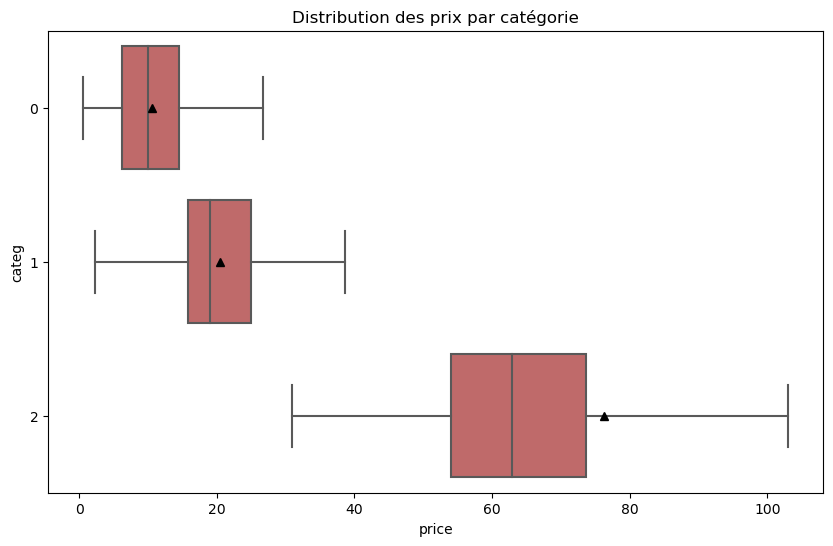

In [46]:
#Distribution des prix par catégorie
plt.figure(figsize=(10,6))
sns.boxplot(data=data, x='price', y='categ', orient='h', showfliers=False, showmeans=True, color='indianred',
           meanprops = {'markeredgecolor':'black',
            'markerfacecolor':'black'})
plt.title("Distribution des prix par catégorie")
plt.show()

<h4 style="margin: auto; padding: 20px; ">2.4 Analyse des clients</h4>

In [47]:
ca_client = data.groupby('client_id')[['price']].sum().reset_index().rename(columns={'price':'chiffre_affaire'})
ca_client.head()

,client_id,chiffre_affaire
0,c_1,629.02
1,c_10,1353.60
2,c_100,254.85
3,c_1000,2291.88
4,c_1001,1823.85


In [48]:
achats = data.groupby('client_id').count()['date'].reset_index().rename(columns={'date':'total_achats'})
achats.head()

,client_id,total_achats
0,c_1,43
1,c_10,58
2,c_100,8
3,c_1000,126
4,c_1001,103


In [49]:
mini = data.groupby('client_id').min()['day'].reset_index().rename(columns={'day':'date_min'})
maxi = data.groupby('client_id').max()['day'].reset_index().rename(columns={'day':'date_max'})

In [50]:
panier_moyen = data.groupby('client_id')['price'].mean().round(2).reset_index().rename(columns={'price':'panier_moyen'})
panier_moyen.head()

,client_id,panier_moyen
0,c_1,14.63
1,c_10,23.34
2,c_100,31.86
3,c_1000,18.19
4,c_1001,17.71


In [51]:
dt = customers.merge(ca_client).merge(panier_moyen).merge(achats).merge(mini).merge(maxi)
dt.head()

,client_id,sex,birth,age,age_bins,chiffre_affaire,panier_moyen,total_achats,date_min,date_max
0,c_4410,f,1967,56,50s,1376.82,18.12,76,2021-03-13,2023-02-22
1,c_7839,f,1975,48,40s,568.92,15.38,37,2021-03-28,2023-02-15
2,c_1699,f,1984,39,30s,190.60,12.71,15,2021-03-13,2022-08-15
3,c_5961,f,1962,61,60s,1150.42,15.14,76,2021-03-13,2023-02-20
4,c_5320,m,1943,80,+80,396.53,16.52,24,2021-03-10,2023-01-04


In [52]:
dt['duree'] = dt['date_max'] - dt['date_min']
dt.head()

,client_id,sex,birth,age,age_bins,chiffre_affaire,panier_moyen,total_achats,date_min,date_max,duree
0,c_4410,f,1967,56,50s,1376.82,18.12,76,2021-03-13,2023-02-22,711 days
1,c_7839,f,1975,48,40s,568.92,15.38,37,2021-03-28,2023-02-15,689 days
2,c_1699,f,1984,39,30s,190.60,12.71,15,2021-03-13,2022-08-15,520 days
3,c_5961,f,1962,61,60s,1150.42,15.14,76,2021-03-13,2023-02-20,709 days
4,c_5320,m,1943,80,+80,396.53,16.52,24,2021-03-10,2023-01-04,665 days


In [53]:
dt['duree'] = dt['duree'].apply(lambda x : x.days)
dt.head()

,client_id,sex,birth,age,age_bins,chiffre_affaire,panier_moyen,total_achats,date_min,date_max,duree
0,c_4410,f,1967,56,50s,1376.82,18.12,76,2021-03-13,2023-02-22,711
1,c_7839,f,1975,48,40s,568.92,15.38,37,2021-03-28,2023-02-15,689
2,c_1699,f,1984,39,30s,190.60,12.71,15,2021-03-13,2022-08-15,520
3,c_5961,f,1962,61,60s,1150.42,15.14,76,2021-03-13,2023-02-20,709
4,c_5320,m,1943,80,+80,396.53,16.52,24,2021-03-10,2023-01-04,665


In [54]:
dt['duree'] = round(dt['duree'] / 30)
dt.head()

,client_id,sex,birth,age,age_bins,chiffre_affaire,panier_moyen,total_achats,date_min,date_max,duree
0,c_4410,f,1967,56,50s,1376.82,18.12,76,2021-03-13,2023-02-22,24.0
1,c_7839,f,1975,48,40s,568.92,15.38,37,2021-03-28,2023-02-15,23.0
2,c_1699,f,1984,39,30s,190.60,12.71,15,2021-03-13,2022-08-15,17.0
3,c_5961,f,1962,61,60s,1150.42,15.14,76,2021-03-13,2023-02-20,24.0
4,c_5320,m,1943,80,+80,396.53,16.52,24,2021-03-10,2023-01-04,22.0


In [55]:
dt['freq_achats'] = round((dt['total_achats'] / dt['duree']),2)
dt.head()

,client_id,sex,birth,age,age_bins,chiffre_affaire,panier_moyen,total_achats,date_min,date_max,duree,freq_achats
0,c_4410,f,1967,56,50s,1376.82,18.12,76,2021-03-13,2023-02-22,24.0,3.17
1,c_7839,f,1975,48,40s,568.92,15.38,37,2021-03-28,2023-02-15,23.0,1.61
2,c_1699,f,1984,39,30s,190.60,12.71,15,2021-03-13,2022-08-15,17.0,0.88
3,c_5961,f,1962,61,60s,1150.42,15.14,76,2021-03-13,2023-02-20,24.0,3.17
4,c_5320,m,1943,80,+80,396.53,16.52,24,2021-03-10,2023-01-04,22.0,1.09


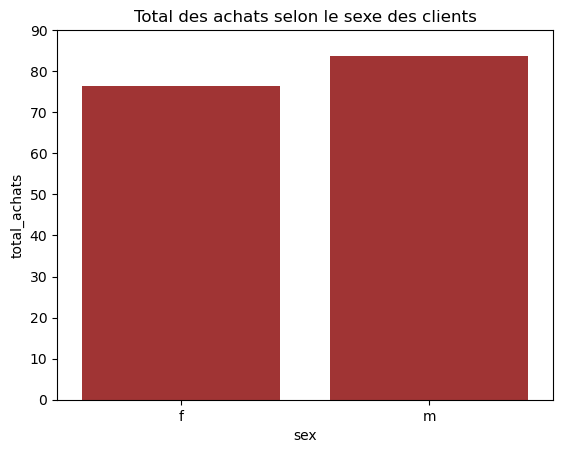

In [56]:
#Total des achats selon le sexe des clients
sns.barplot(data=dt, x='sex', y='total_achats', color='firebrick', errorbar=None)
plt.ylim([0,90])
plt.yticks([0,10,20,30,40,50,60,70,80,90])
plt.title("Total des achats selon le sexe des clients")
plt.show()

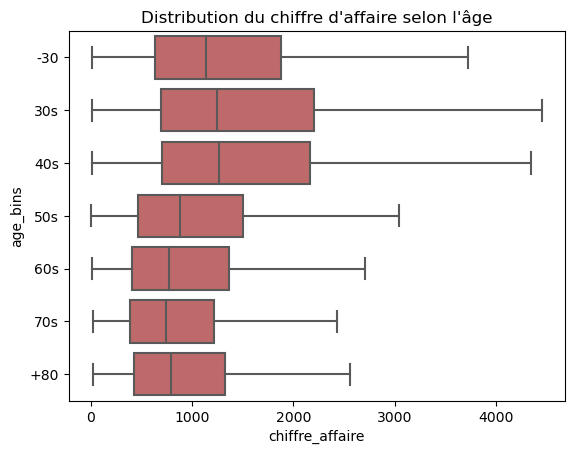

In [57]:
#Distribution du chiffre d'affaire selon l'âge des clients
sns.boxplot(data=dt.sort_values('age_bins'), x='chiffre_affaire', y='age_bins', color='indianred', showfliers=False)
plt.title("Distribution du chiffre d'affaire selon l'âge")
plt.show()

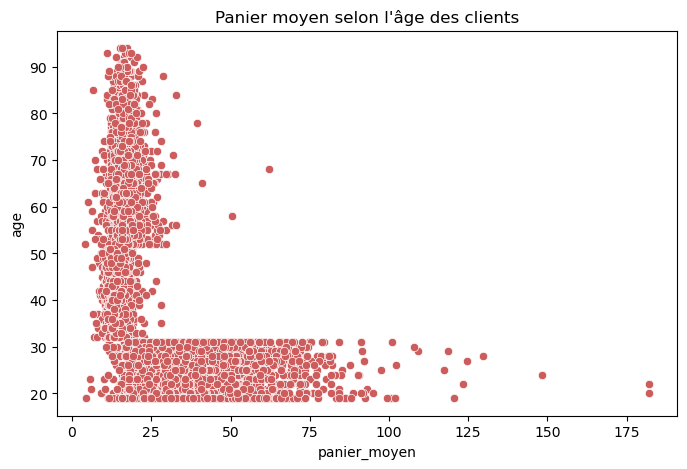

In [58]:
#Panier moyen en fonction de l'âge des clients
plt.figure(figsize=(8,5))
sns.scatterplot(data=dt, x='panier_moyen', y='age', color='indianred')
plt.title("Panier moyen selon l'âge des clients")
plt.show()

In [59]:
#Trie des clients selon leur chiffre d'affaires
dt.sort_values('chiffre_affaire', ascending=False)

,client_id,sex,birth,age,age_bins,chiffre_affaire,panier_moyen,total_achats,date_min,date_max,duree,freq_achats
3633,c_1609,m,1980,43,40s,326039.89,12.74,25586,2021-03-01,2023-02-28,24.0,1066.08
1377,c_4958,m,1999,24,-30,290227.03,55.58,5222,2021-03-01,2023-02-28,24.0,217.58
1910,c_6714,f,1968,55,50s,153918.60,16.73,9199,2021-03-01,2023-02-28,24.0,383.29
8067,c_3454,m,1969,54,50s,114110.57,16.80,6793,2021-03-01,2023-02-28,24.0,283.04
1483,c_1570,f,1979,44,40s,5285.82,14.29,370,2021-03-03,2023-02-21,24.0,15.42
4713,c_3263,f,1985,38,30s,5276.87,13.09,403,2021-03-15,2023-02-26,24.0,16.79
612,c_2140,f,1977,46,40s,5260.18,12.99,405,2021-03-17,2023-02-28,24.0,16.88
3932,c_2899,f,1994,29,-30,5214.05,49.66,105,2021-03-24,2023-02-21,23.0,4.57
5134,c_7319,f,1974,49,40s,5155.77,13.90,371,2021-03-03,2023-02-26,24.0,15.46
368,c_7959,f,1974,49,40s,5135.75,13.81,372,2021-03-03,2023-02-27,24.0,15.50


In [60]:
outliers = ['c_1609','c_4958','c_6714','c_3454']
dt1 = dt.drop(dt[dt['client_id'].isin(outliers)].index)
dt1.head()

,client_id,sex,birth,age,age_bins,chiffre_affaire,panier_moyen,total_achats,date_min,date_max,duree,freq_achats
0,c_4410,f,1967,56,50s,1376.82,18.12,76,2021-03-13,2023-02-22,24.0,3.17
1,c_7839,f,1975,48,40s,568.92,15.38,37,2021-03-28,2023-02-15,23.0,1.61
2,c_1699,f,1984,39,30s,190.60,12.71,15,2021-03-13,2022-08-15,17.0,0.88
3,c_5961,f,1962,61,60s,1150.42,15.14,76,2021-03-13,2023-02-20,24.0,3.17
4,c_5320,m,1943,80,+80,396.53,16.52,24,2021-03-10,2023-01-04,22.0,1.09


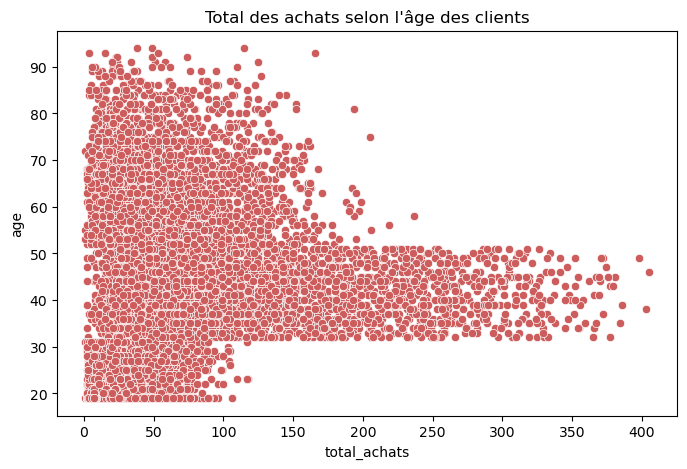

In [61]:
#Total des achats selon l'âge des clients sans outliers
plt.figure(figsize=(8,5))
sns.scatterplot(data=dt1, x='total_achats', y='age', color='indianred')
plt.title("Total des achats selon l'âge des clients")
plt.show()

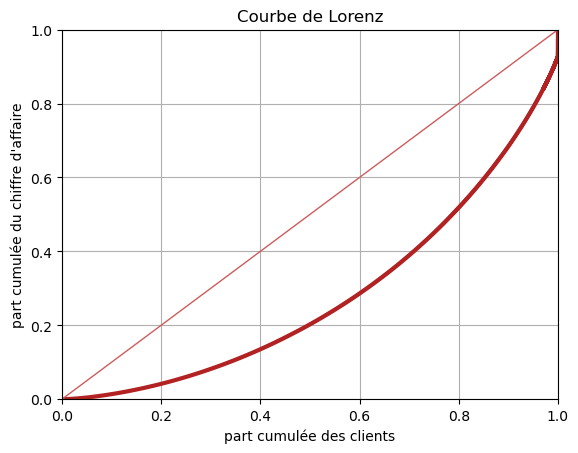

In [62]:
#Courbe de Lorenz avec les clients outliers
ca = dt['chiffre_affaire'].values
n=len(ca)
lorenz = np.cumsum(np.sort(ca)) / ca.sum()
lorenz = np.append([0],lorenz)

xaxis = np.linspace(0-1/n,1+1/n,n+1)
plt.plot(xaxis,lorenz,drawstyle='steps-post', color='firebrick',lw=3)
plt.plot([0.0,1.0], color='indianred', lw=1)
plt.title("Courbe de Lorenz")
plt.xlabel('part cumulée des clients')
plt.ylabel("part cumulée du chiffre d'affaire")
plt.xlim([0,1])
plt.ylim([0,1])
plt.grid()
plt.show()

In [63]:
#Indice de Gini des clients avec outliers
AUC = (lorenz.sum() -lorenz[-1]/2 -lorenz[0]/2)/n
S = 0.5 - AUC
gini = 2*S
gini

0.44189587995615676

L'indice de gini est de 0.44. La répartition du chiffre d'affaire est assez égalitaire

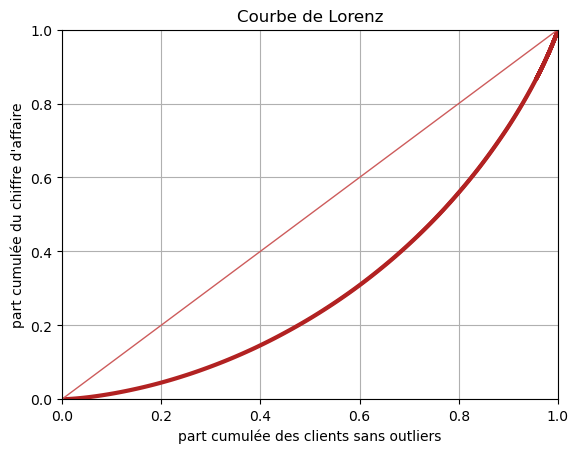

In [64]:
#Courbe de Lorenz des clients sans outliers
ca1 = dt1['chiffre_affaire'].values
n=len(ca1)
lorenz1 = np.cumsum(np.sort(ca1)) / ca1.sum()
lorenz1 = np.append([0],lorenz1)

xaxis = np.linspace(0-1/n,1+1/n,n+1)
plt.plot(xaxis,lorenz1,drawstyle='steps-post', color='firebrick',lw=3)
plt.plot([0.0,1.0], color='indianred', lw=1)
plt.title("Courbe de Lorenz")
plt.xlabel('part cumulée des clients sans outliers')
plt.ylabel("part cumulée du chiffre d'affaire")
plt.xlim([0,1])
plt.ylim([0,1])
plt.grid()
plt.show()

In [65]:
#Indice de Gini des clients sans outliers
AUC1 = (lorenz1.sum() -lorenz1[-1]/2 -lorenz1[0]/2)/n
S1 = 0.5 - AUC1
gini1 = 2*S1
gini1

0.39828603507456595

L'indice de gini en excluant les clients outliers, est de 0.39, la répartition du chiffre d'affaire est encore plus égalitaire.

<div >
<h3 style="margin: auto; padding: 20px; ">3. Corrélations</h3>
</div>

In [66]:
pip install scipy

Note: you may need to restart the kernel to use updated packages.


<h4 style="margin: auto; padding: 20px; ">3.1 Corrélation entre le genre et la catégorie</h4>

In [67]:
#Corrélation entre le genre des clients et la catégorie de livres achetés
# Khi2
X= 'categ' #qualitative
Y= 'sex' #qualitative

cont = data[[X,Y]].pivot_table(index=X, columns=Y, aggfunc=len, margins=True,margins_name="Total")
cont

sex,f,m,Total
categ,,,
0,206103,209356,415459
1,119307,116285,235592
2,17283,19200,36483
Total,342693,344841,687534


In [68]:
from scipy.stats import chi2_contingency as chi2_contingency

khi2, pval , ddl , contingent_theorique = chi2_contingency(cont)

In [69]:
pval

1.3871985875925787e-31

La p-value est inférieure à 0.05% donc les variables ne sont pas corrélées. 

<h4 style="margin: auto; padding: 20px; ">3.2 Corrélation entre l'âge et le montant total des achats</h4>

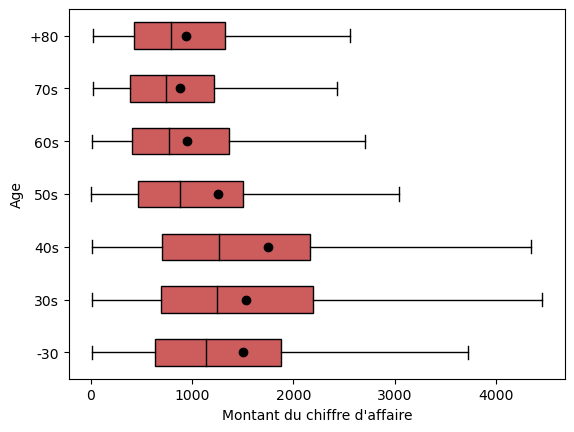

In [70]:
#Corrélation entre l'âge des clients et le montant total des achats
dt = dt.sort_values('age_bins')
X='age_bins' #qualitative
Y='chiffre_affaire' #quantitative

modalites = dt[X].unique()
groupes = []
for m in modalites:
    groupes.append(dt[dt[X]==m][Y])

# Propriétés graphiques   
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'black'}
    
plt.boxplot(groupes, labels=modalites, medianprops=medianprops, showfliers=False,
            boxprops=dict(facecolor='indianred',color='black'),
            vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.ylabel("Age")
plt.xlabel("Montant du chiffre d'affaire")
plt.show()

In [71]:
pip install pingouin

Note: you may need to restart the kernel to use updated packages.


In [72]:
import pingouin as pg

In [73]:
#Test comparaison
aov = pg.anova(dv='chiffre_affaire', between='age_bins', data=dt, detailed=True, effsize='n2')
aov

,Source,SS,DF,MS,F,p-unc,n2
0,age_bins,6.812493e+08,6,1.135415e+08,4.203926,0.000315,0.002927
1,Within,2.320836e+11,8593,2.700845e+07,NaN,NaN,NaN


L'éta-squared est de 0.002, résultat très proche de 0 donc pas de corrélation entre l'âge des clients et le montant des achats.

In [74]:
from scipy.stats import pearsonr

In [75]:
#Corrélation entre l'âge des clients et le montant total des achats
#Test Pearson, 2 variables quantitatives
corr, _ = pearsonr(dt['age'],dt['chiffre_affaire'])
print(corr)

-0.03975597869436883


In [76]:
corr, pval = pearsonr(dt['age'],dt['chiffre_affaire'])
print(corr, pval)

-0.03975597869436883 0.00022625490557779147


Le résultat de r est proche de 0, donc peu de corrélation.

In [77]:
from spicy import stats

C:\Users\clara\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


In [78]:
stats.kstest(dt['age'],dt['chiffre_affaire'])

KstestResult(statistic=0.9875581395348837, pvalue=0.0, statistic_location=94.0, statistic_sign=1)

La p-value est <0.05, l'âge et le chiffre d'affaire ne suivent pas une loi normale.
Je réalise donc un test de spearman qui est non-paramétrique.

In [79]:
resu = stats.spearmanr(dt['age'],dt['chiffre_affaire'])
resu

SignificanceResult(statistic=-0.18437921734918347, pvalue=1.2375957986507004e-66)

La p-value est >0.05, on ne rejette pas l'hypothèse d'un lien entre l'âge et le chiffre d'affaire.

<h4 style="margin: auto; padding: 20px; ">3.3 Corrélation entre l'âge et la fréquence des achats</h4>

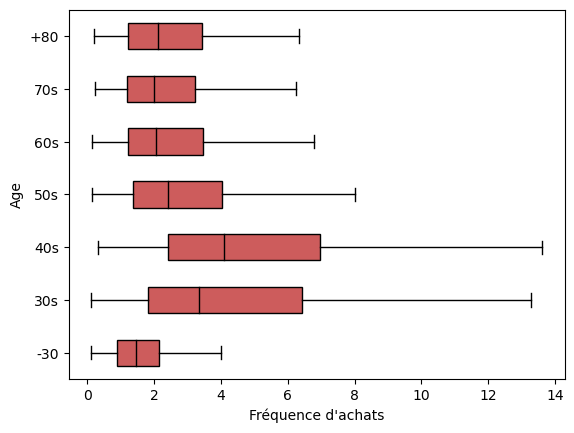

In [80]:
#Corrélation entre l'âge des clients et la fréquence des achats 
X='age_bins' #qualitative
Y='freq_achats' #quantitative

modalites = dt[X].unique()
groupes = []
for m in modalites:
    groupes.append(dt[dt[X]==m][Y])

# Propriétés graphiques   
medianprops = {'color':"black"}
    
plt.boxplot(groupes, labels=modalites, medianprops=medianprops, showfliers=False,
            boxprops=dict(facecolor='indianred',color='black'),
            vert=False, patch_artist=True,showmeans=False)
plt.ylabel("Age")
plt.xlabel("Fréquence d'achats")
plt.show()

In [81]:
#Test comparaison
aav = pg.anova(dv='freq_achats', between='age_bins', data=dt, detailed=True, effsize='n2')
aav

C:\Users\clara\anaconda3\Lib\site-packages\pingouin\parametric.py:1006: RuntimeWarning: invalid value encountered in scalar divide
  fval = msbetween / mserror
C:\Users\clara\anaconda3\Lib\site-packages\pingouin\parametric.py:1012: RuntimeWarning: invalid value encountered in scalar divide
  np2 = ssbetween / (ssbetween + sserror)  # = ssbetween / sstotal


,Source,SS,DF,MS
0,age_bins,inf,6,inf
1,Within,inf,8593,inf


In [82]:
dt.sort_values('freq_achats',ascending=False)

,client_id,sex,birth,age,age_bins,chiffre_affaire,panier_moyen,total_achats,date_min,date_max,duree,freq_achats
4512,c_6207,m,1956,67,60s,88.86,22.22,4,2021-11-16,2021-11-16,0.0,inf
2877,c_2290,f,1998,25,-30,89.98,44.99,2,2021-08-03,2021-08-03,0.0,inf
1358,c_3308,f,1991,32,30s,21.03,7.01,3,2021-10-29,2021-10-29,0.0,inf
8338,c_5640,f,1969,54,50s,32.52,16.26,2,2022-01-26,2022-01-26,0.0,inf
2361,c_6292,m,1992,31,30s,24.24,24.24,1,2021-03-09,2021-03-09,0.0,inf
1169,c_8051,f,1992,31,30s,110.47,55.24,2,2021-12-01,2021-12-01,0.0,inf
1416,c_1624,m,1992,31,30s,28.54,28.54,1,2021-04-27,2021-04-27,0.0,inf
8419,c_450,m,1953,70,70s,67.18,13.44,5,2021-12-06,2021-12-06,0.0,inf
6822,c_1412,f,1993,30,30s,101.98,50.99,2,2021-08-10,2021-08-10,0.0,inf
5472,c_6040,f,1974,49,40s,15.72,7.86,2,2021-12-06,2021-12-06,0.0,inf


In [83]:
dt2 = dt.drop(dt[dt['duree'] == 0].index)
dt2.sort_values('freq_achats',ascending=False)

,client_id,sex,birth,age,age_bins,chiffre_affaire,panier_moyen,total_achats,date_min,date_max,duree,freq_achats
3633,c_1609,m,1980,43,40s,326039.89,12.74,25586,2021-03-01,2023-02-28,24.0,1066.08
1910,c_6714,f,1968,55,50s,153918.60,16.73,9199,2021-03-01,2023-02-28,24.0,383.29
8067,c_3454,m,1969,54,50s,114110.57,16.80,6793,2021-03-01,2023-02-28,24.0,283.04
1377,c_4958,m,1999,24,-30,290227.03,55.58,5222,2021-03-01,2023-02-28,24.0,217.58
612,c_2140,f,1977,46,40s,5260.18,12.99,405,2021-03-17,2023-02-28,24.0,16.88
4713,c_3263,f,1985,38,30s,5276.87,13.09,403,2021-03-15,2023-02-26,24.0,16.79
6298,c_2595,m,1974,49,40s,4959.66,12.46,398,2021-03-01,2023-02-12,24.0,16.58
3015,c_8556,m,1976,47,40s,4679.39,12.51,374,2021-03-14,2023-02-12,23.0,16.26
7454,c_2077,f,1984,39,30s,4848.06,12.56,386,2021-03-03,2023-02-28,24.0,16.08
3000,c_1637,f,1988,35,30s,4798.83,12.50,384,2021-03-13,2023-02-24,24.0,16.00


In [84]:
aav1 = pg.anova(dv='freq_achats', between='age_bins', data=dt2, detailed=True, effsize='n2')
aav1

,Source,SS,DF,MS,F,p-unc,n2
0,age_bins,1.803762e+04,6,3006.269763,17.806705,1.269132e-20,0.01231
1,Within,1.447193e+06,8572,168.827969,NaN,NaN,NaN


L'éta-squared est de 0.012, résultat proche de 0 donc pas de corrélation entre l'âge des clients et la fréquence des achats.

<h4 style="margin: auto; padding: 20px; ">3.4 Corrélation entre l'âge et la taille du panier moyen</h4>

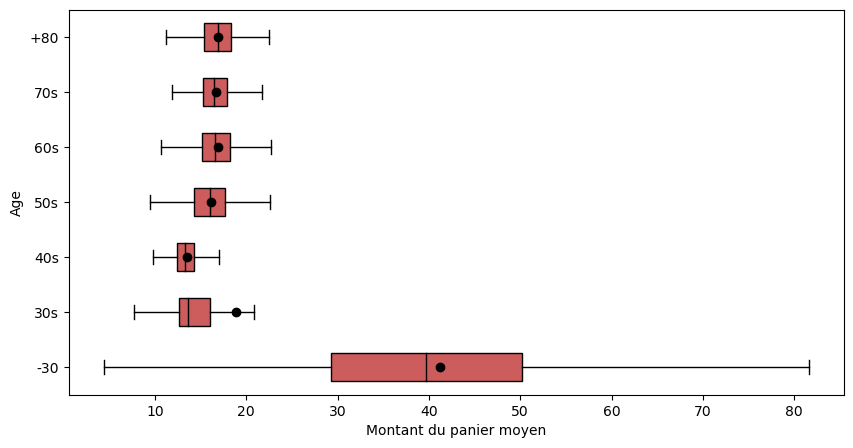

In [86]:
#Corrélation entre l'âge et la taille du panier moyen
dt2 = dt.sort_values('age_bins')
X='age_bins' #qualitative
Y='panier_moyen' #quantitative

modalites = dt2[X].unique()
groupes = []
for m in modalites:
    groupes.append(dt2[dt2[X]==m][Y])

# Propriétés graphiques   
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'black'}

plt.figure(figsize=(10,5))
plt.boxplot(groupes, labels=modalites, showfliers=False, medianprops=medianprops, 
            boxprops=dict(facecolor='indianred',color='black'),
            vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.ylabel("Age")
plt.xlabel("Montant du panier moyen")
plt.show()

In [87]:
av = pg.anova(dv='panier_moyen', between='age_bins', data=dt, detailed=True, effsize='n2')
av

,Source,SS,DF,MS,F,p-unc,n2
0,age_bins,963315.488069,6,160552.581345,1570.086592,0.0,0.522969
1,Within,878695.696666,8593,102.257151,NaN,NaN,NaN


L'éta-squared est de 0.52 ce qui laisse penser qu'il y a une corrélation entre l'âge et le montant du panier moyen.

<h4 style="margin: auto; padding: 20px; ">3.5 Corrélation entre l'âge et la catégorie</h4>

In [88]:
#Corrélation entre l'âge et la catégorie de livres achetés

X= 'categ' #qualitative
Y= 'age_bins' #qualitative

contin = data[[X,Y]].pivot_table(index=X, columns=Y, aggfunc=len, margins=True,margins_name="Total")
contin

age_bins,-30,30s,40s,50s,60s,70s,+80,Total
categ,,,,,,,,
0,14412,119972,177018,62257,24801,11541,5458,415459
1,27656,41628,56309,54896,32685,15065,7353,235592
2,29063,4696,769,1056,550,219,130,36483
Total,71131,166296,234096,118209,58036,26825,12941,687534


In [89]:
khi2, pval , ddl , contingent_theorique = chi2_contingency(contin)
pval

0.0

La p-value est de 0.00, ce qui veut dire qu'il y a de corrélation entre l'âge et la catégorie de livre achetés.

In [90]:
stats.levene(data['age'],data['categ'], center='median')

LeveneResult(statistic=805788.1005066641, pvalue=0.0)

La p-value est de 0.0, donc il y a une variance inégale.

In [91]:
df0 = data.loc[data['categ']==0]['age']

In [92]:
df1 = data.loc[data['categ']==1]['age']

In [93]:
df2 = data.loc[data['categ']==2]['age']

In [94]:
stats.kruskal(df0,df1,df2)

KruskalResult(statistic=78458.43837285662, pvalue=0.0)

La p-value est de 0.0, on rejette l'hypothèse nulle selon laquelle il n'y aurait pas de différence entre l'âge et la catégorie.